![JohnSnowLabs](https://nlp.johnsnowlabs.com/assets/images/logo.png)

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JohnSnowLabs/spark-nlp-workshop/blob/master/healthcare-nlp/09.3.Spark_OCR_Utility_Module.ipynb)

## Blogposts and videos

- [Text Detection in Spark OCR](https://medium.com/spark-nlp/text-detection-in-spark-ocr-dcd8002bdc97)

- [Table Detection & Extraction in Spark OCR](https://medium.com/spark-nlp/table-detection-extraction-in-spark-ocr-50765c6cedc9)

- [Extract Tabular Data from PDF in Spark OCR](https://medium.com/spark-nlp/extract-tabular-data-from-pdf-in-spark-ocr-b02136bc0fcb)

- [Signature Detection in Spark OCR](https://medium.com/spark-nlp/signature-detection-in-spark-ocr-32f9e6f91e3c)

- [GPU image pre-processing in Spark OCR](https://medium.com/spark-nlp/gpu-image-pre-processing-in-spark-ocr-3-1-0-6fc27560a9bb)

- [How to Setup Spark OCR on UBUNTU - Video](https://www.youtube.com/watch?v=cmt4WIcL0nI)


**More examples here**

https://github.com/JohnSnowLabs/spark-ocr-workshop

For get the trial license please go to:

https://www.johnsnowlabs.com/install/

### Colab Setup

In [ ]:
# Install the johnsnowlabs library to access Spark-OCR and Spark-NLP for Healthcare, Finance, and Legal.
!pip install -q johnsnowlabs

In [ ]:
 from google.colab import files
print('Please Upload your John Snow Labs License using the button below')
license_keys = files.upload()

In [ ]:
from johnsnowlabs import nlp, visual, medical

# After uploading your license run this to install all licensed Python Wheels and pre-download Jars the Spark Session JVM
nlp.install(refresh_install=True, visual=True)

In [2]:
# Automatically load license data and start a session with all jars user has access to
spark = nlp.start(visual=True)

👌 Detected license file /content/spark_nlp_for_healthcare_spark_ocr_9005 (2).json
👌 Launched cpu optimized session with with: 🚀Spark-NLP==5.3.1, 💊Spark-Healthcare==5.3.1, 🕶Spark-OCR==5.3.1, running on ⚡ PySpark==3.4.0


In [3]:
import pandas as pd
import pkg_resources
from pyspark.ml import PipelineModel
from pyspark.sql import functions as F
from sparkocr.transformers import *
from pyspark.ml import PipelineModel
from sparkocr.utils import display_image, display_images, display_table, display_tables, to_pil_image
from sparkocr.metrics import score
from sparkocr.enums import *
from sparknlp.base import *
from sparknlp_jsl.annotator import *

# NER Pipeline

In [4]:
document_assembler = nlp.DocumentAssembler() \
    .setInputCol("text") \
    .setOutputCol("document")

# Sentence Detector annotator, processes various sentences per line
sentence_detector = nlp.SentenceDetector() \
    .setInputCols(["document"]) \
    .setOutputCol("sentence")

tokenizer = nlp.Tokenizer() \
    .setInputCols(["sentence"]) \
    .setOutputCol("token")

# Clinical word embeddings
word_embeddings = nlp.WordEmbeddingsModel.pretrained("embeddings_clinical", "en", "clinical/models") \
    .setInputCols(["sentence", "token"]) \
    .setOutputCol("embeddings")

clinical_ner = medical.NerModel.pretrained("ner_clinical", "en", "clinical/models") \
    .setInputCols(["sentence", "token", "embeddings"]) \
    .setOutputCol("clinical_ner")

clinical_ner_converter = medical.NerConverterInternal() \
    .setInputCols(["sentence", "token", "clinical_ner"]) \
    .setOutputCol("clinical_ner_chunk") \
    .setBlackList(["TREATMENT", "TEST"])

deid_ner = medical.NerModel.pretrained("ner_deid_subentity_augmented", "en", "clinical/models") \
    .setInputCols(["sentence", "token", "embeddings"]) \
    .setOutputCol("deid_ner")

deid_ner_converter = medical.NerConverterInternal() \
    .setInputCols(["sentence", "token", "deid_ner"]) \
    .setOutputCol("deid_ner_chunk")

chunk_merger = medical.ChunkMergeApproach()\
    .setInputCols(["clinical_ner_chunk", "deid_ner_chunk"])\
    .setOutputCol("merged_chunk")

nlp_pipeline = nlp.Pipeline(stages=[
        document_assembler,
        sentence_detector,
        tokenizer,
        word_embeddings,
        clinical_ner,
        clinical_ner_converter,
        deid_ner,
        deid_ner_converter,
        chunk_merger
    ])
empty_data = spark.createDataFrame([[""]]).toDF("text")
nlp_model = nlp_pipeline.fit(empty_data)

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]
ner_clinical download started this may take some time.
[OK!]
ner_deid_subentity_augmented download started this may take some time.
[OK!]


In [5]:
!wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-nlp-workshop/master/tutorials/Certification_Trainings/Healthcare/data/ocr/MT_OCR_HW_01.pdf -P content/

# Module

In [6]:
from sparknlp_jsl.utils.ocr_nlp_processor import ocr_entity_processor

### Description of the parameters

+ file_path = path to pdf file
+ ner_pipeline = fitted NER pipeline,
+ chunk_col = output col name of the NER pipeline,
+ style = type of the process,
+ save_path = path to save file,
+ label= if True, labels show up
+ label_color = color of the label
+ display_result = show output
+ black_list = labels that will be banded over (like PHI). Each label will be banded over with the assigned color.
+ confidenceThreshold = enables to set confidence (default : 70)
+ resolution = enables to set confidence (default : 200)
+ text_band = insert specific text on the colored band
+ outline_color = configure a desired specific color using RGB tuples for the bounding box style.
+ outline_width = Adjust width of the outline.
+ text_type = Choose what is the type of the text to be handled: `printed`, `handwritten` or `both`. (default: `printed`)

### Colored Box

OCR pipeline is running...
Drawing colored box...
Saving started...
File saved to colored_box/MT_OCR_HW_01_colored_box.pdf successfully.


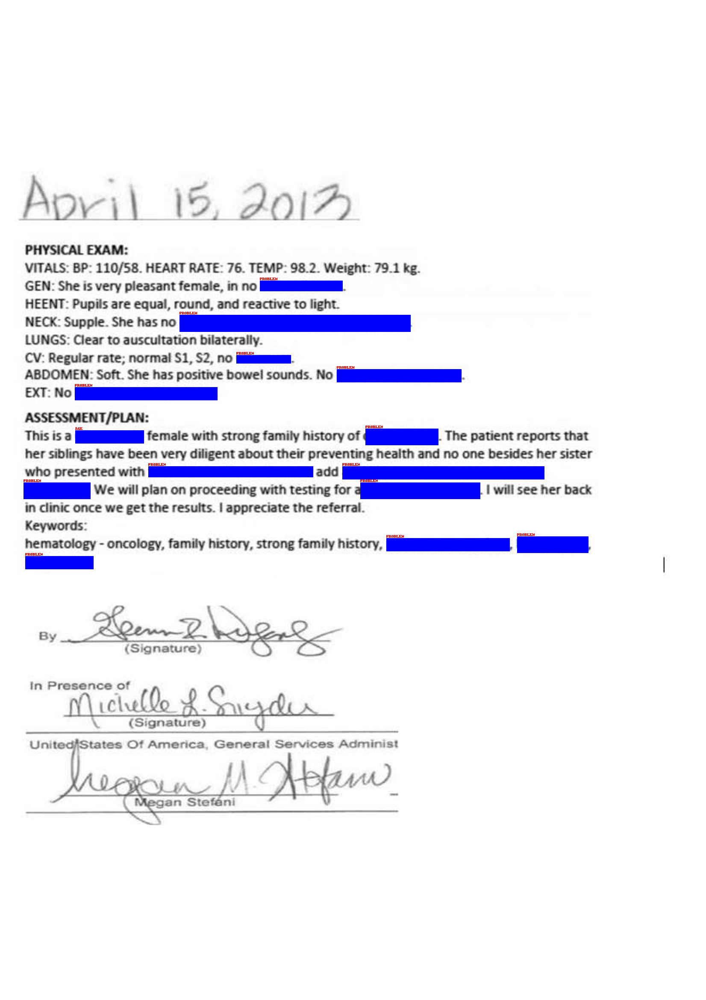

In [7]:
# Colored Band with labels

path='content/*.pdf'
box = "colored_box"

ocr_entity_processor(spark=spark,
                    file_path = path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "colored_box",
                    box_color = (0, 0, 255),
                    label= True,
                    label_color = "red",
                    display_result = True)

OCR pipeline is running...
Drawing colored box...
Saving started...
File saved to colored_box/MT_OCR_HW_01_colored_box.pdf successfully.


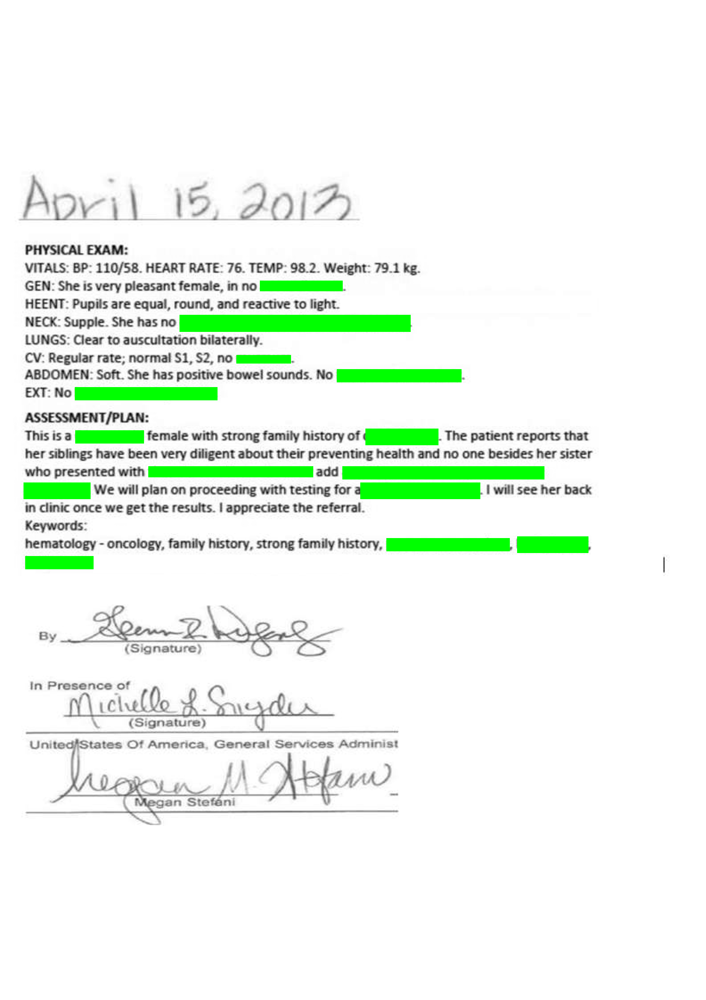

In [8]:
# Colored Band without labels

path='content/*.pdf'
box = "colored_box"

ocr_entity_processor(spark=spark,
                    file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "colored_box",
                    box_color = (0, 255, 0),
                    label= False,
                    label_color = "red",
                    display_result = True)

OCR pipeline is running...
Drawing colored box...
Saving started...
File saved to colored_box/MT_OCR_HW_01_colored_box.pdf successfully.


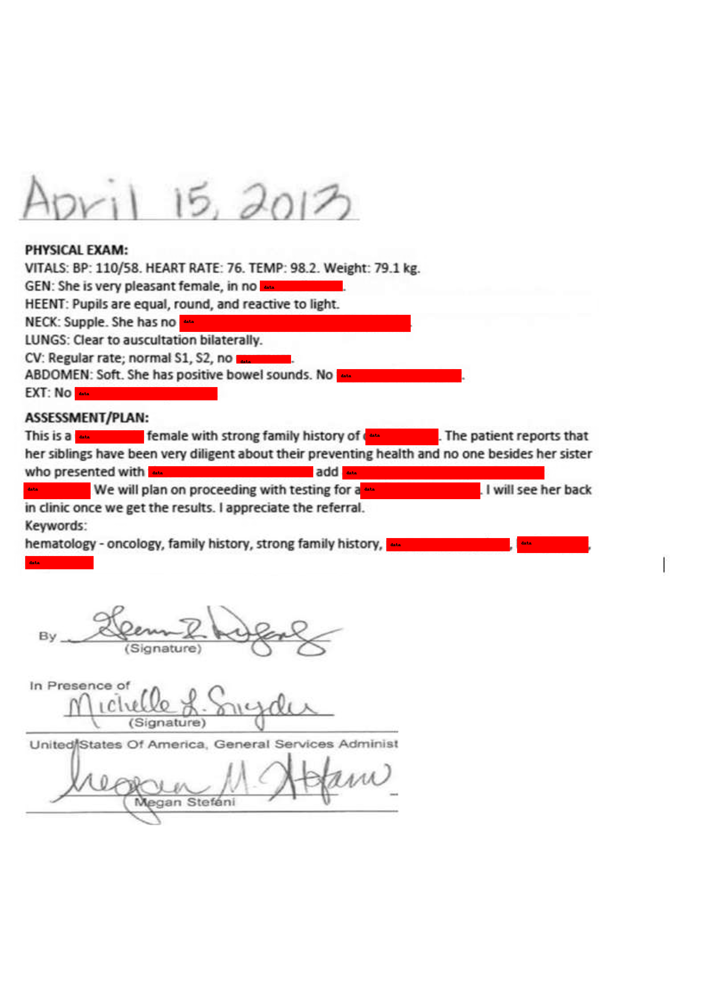

In [9]:
# Colored Band with text band parameter

path='content/*.pdf'
box = "colored_box"

ocr_entity_processor(spark=spark,
                    file_path = path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "colored_box",
                    box_color = (255, 0, 0),
                    display_result = True ,
                    text_band="data")   ## Default None (without)

image_handwritten_detector_gsa0803 download started this may take some time.
Approximate size to download 244.5 MB
OCR pipeline is running...
Drawing colored box...
Saving started...
File saved to colored_box/MT_OCR_HW_01_colored_box.pdf successfully.


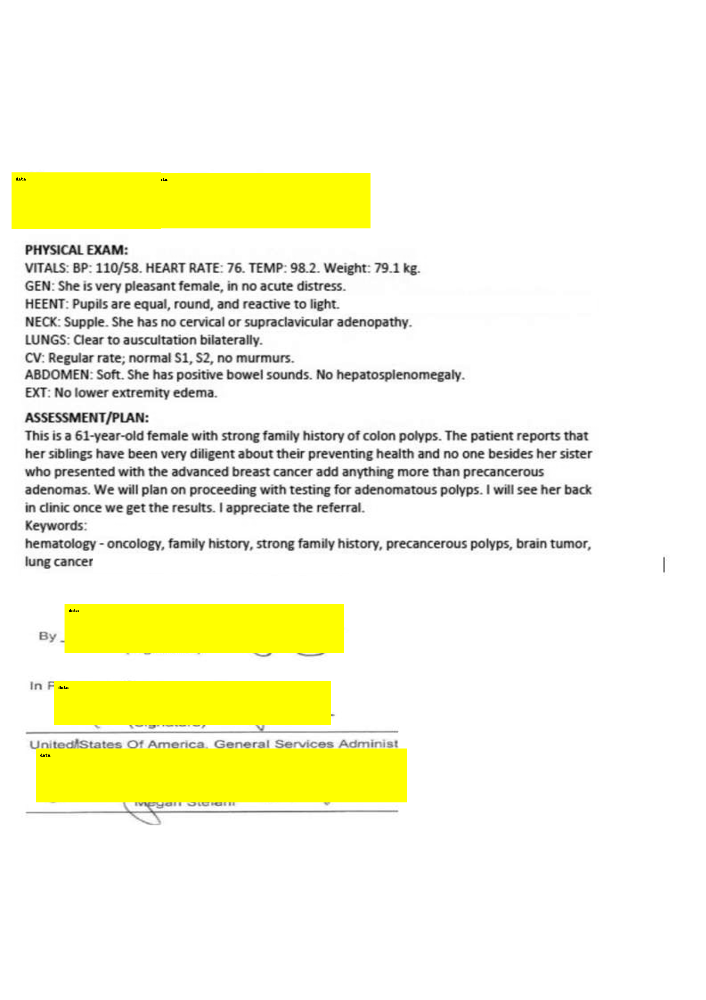

In [10]:
# Colored Band with text band and text type parameters
# Handling just handwritten text

path='content/*.pdf'
box = "colored_box"

ocr_entity_processor(spark=spark,
                    file_path = path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "colored_box",
                    box_color = (255, 255, 0),
                    display_result = True ,
                    text_band="data",
                    text_type = "handwritten")    ## Default = "printed"

image_handwritten_detector_gsa0803 download started this may take some time.
Approximate size to download 244.5 MB
OCR pipeline is running...
Drawing colored box...
Saving started...
File saved to colored_box/MT_OCR_HW_01_colored_box.pdf successfully.


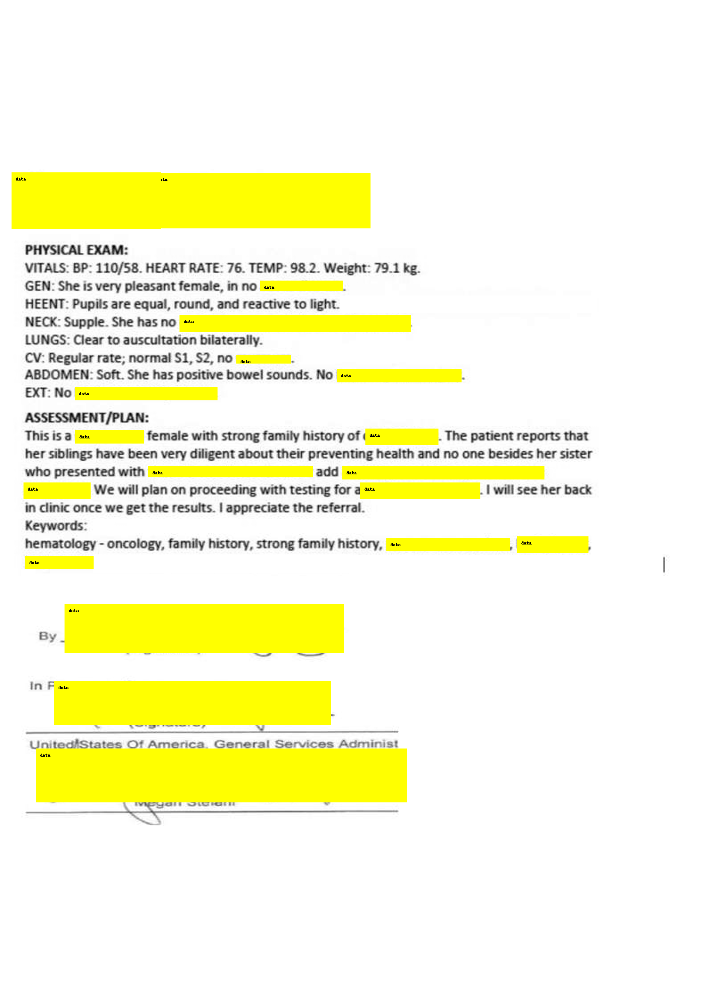

In [11]:
# Colored Band with text band and text type parameters
# Handling both handwritten and printed text at the same time

path='content/*.pdf'
box = "colored_box"

ocr_entity_processor(spark=spark,
                    file_path = path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "colored_box",
                    box_color = (255, 255, 0),
                    display_result = True ,
                    text_band="data",
                    text_type = "both")    ## Default = "printed"

### Bounding Box

OCR pipeline is running...
Drawing bounding box...
Saving started...
File saved to bounding_box/MT_OCR_HW_01_bounding_box.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


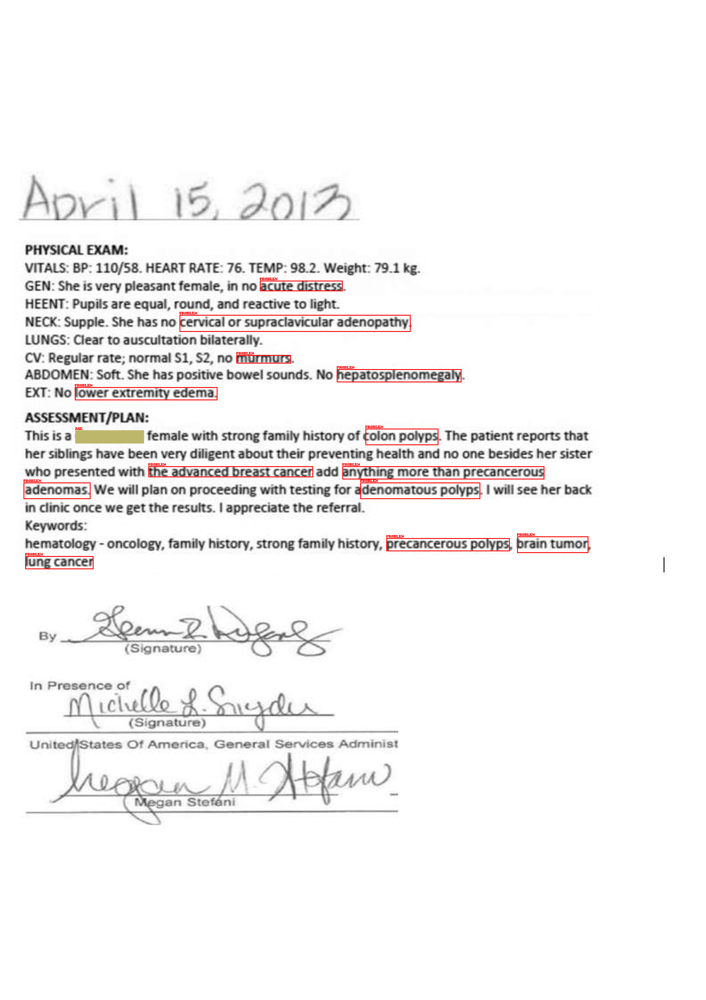

In [12]:
# Bounding Box with labels and black list

path='content/*.pdf'
box = "bounding_box"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    black_list = ["AGE", "DAte", "PATIENT"],
                    style = box,
                    save_dir = "bounding_box",
                    label= True,
                    label_color = "red",
                    color_chart_path = "label_colors.png",
                    display_result=True)

In [13]:
# Bounding Box without display

path='content/*.pdf'
box = "bounding_box"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    black_list = ["AGE", "DAte", "PATIENT"],
                    style = box,
                    save_dir = "bounding_box",
                    label= True,
                    label_color = "red",
                    color_chart_path = "label_colors.png",
                    display_result=False)

OCR pipeline is running...
Drawing bounding box...
Saving started...
File saved to bounding_box/MT_OCR_HW_01_bounding_box.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


OCR pipeline is running...
Drawing bounding box...
Saving started...
File saved to bounding_box/MT_OCR_HW_01_bounding_box.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


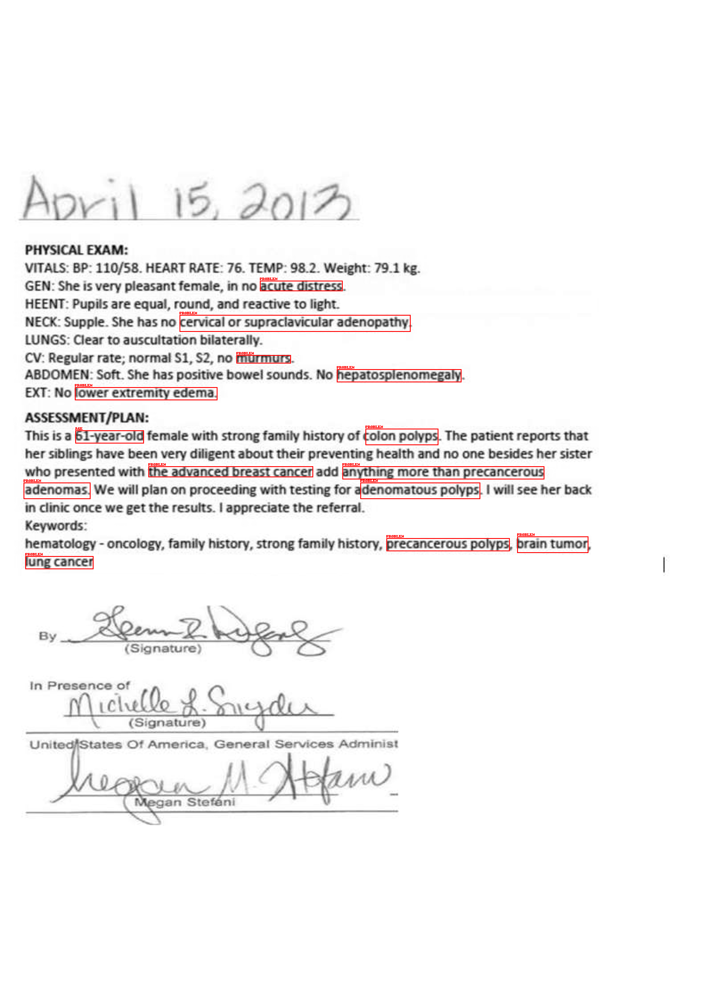

In [14]:
# Bounding Box without black list

path='content/*.pdf'
box = "bounding_box"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "bounding_box",
                    label= True,
                    label_color = "red",
                    color_chart_path = "label_colors.png",
                    display_result=True)

OCR pipeline is running...
Drawing bounding box...
Saving started...
File saved to bounding_box/MT_OCR_HW_01_bounding_box.pdf successfully.
Color chart of the entity labels is saved to color_chart.png.


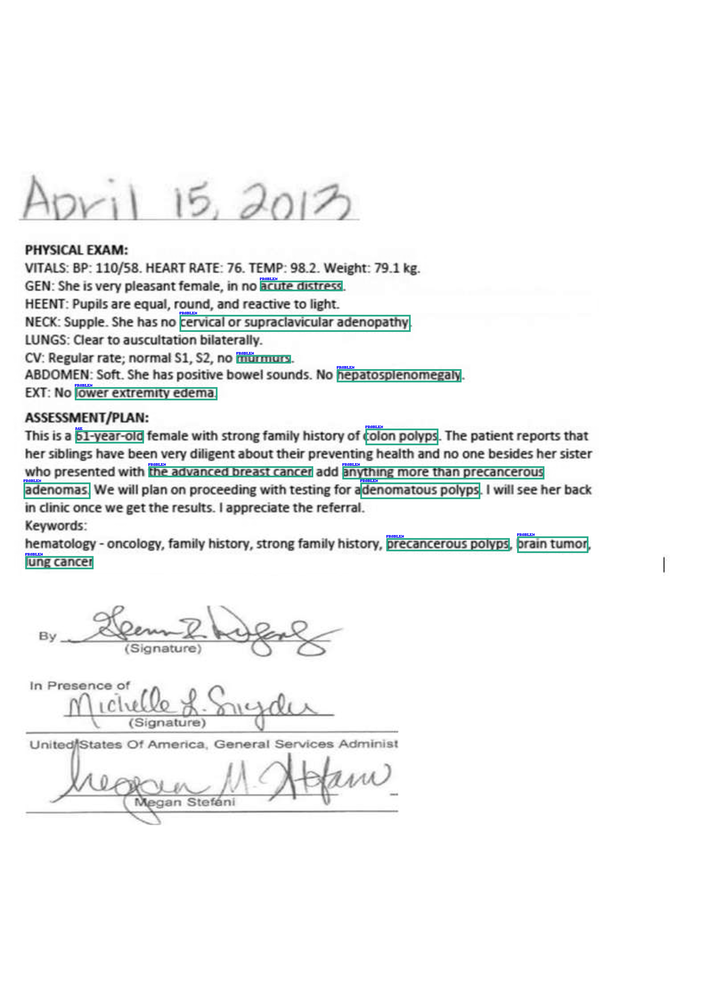

In [15]:
# Bounding Box with adjusting outline width and outline color

path='content/*.pdf'
box = "bounding_box"

ocr_entity_processor(spark=spark,
                    file_path = path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "bounding_box",
                    label= True,
                    label_color = "blue",
                    display_result = True ,
                    outline_width = 4,                     ## Default = 2
                    outline_color = (42, 170, 138))        ## Takes RGB tuples (42, 170, 138) : Jungle Gree)

image_handwritten_detector_gsa0803 download started this may take some time.
Approximate size to download 244.5 MB
OCR pipeline is running...
Drawing bounding box...
Saving started...
File saved to bounding_box/MT_OCR_HW_01_bounding_box.pdf successfully.
Color chart of the entity labels is saved to color_chart.png.


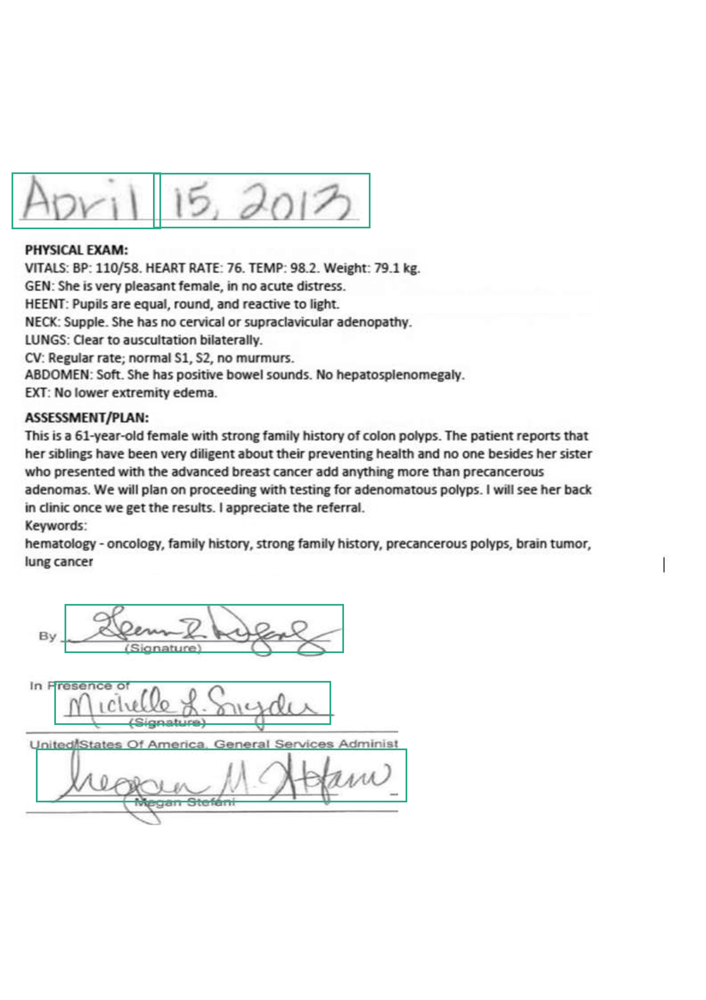

In [16]:
# Bounding Box with text type parameter
# Handling just handwritten text

path='content/*.pdf'
box = "bounding_box"

ocr_entity_processor(spark=spark,
                    file_path = path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "bounding_box",
                    label= False,
                    display_result = True ,
                    outline_width = 4,
                    outline_color = (42, 170, 138),
                    text_type = "handwritten")    ## Default = "printed"

image_handwritten_detector_gsa0803 download started this may take some time.
Approximate size to download 244.5 MB
OCR pipeline is running...
Drawing bounding box...
Saving started...
File saved to bounding_box/MT_OCR_HW_01_bounding_box.pdf successfully.
Color chart of the entity labels is saved to color_chart.png.


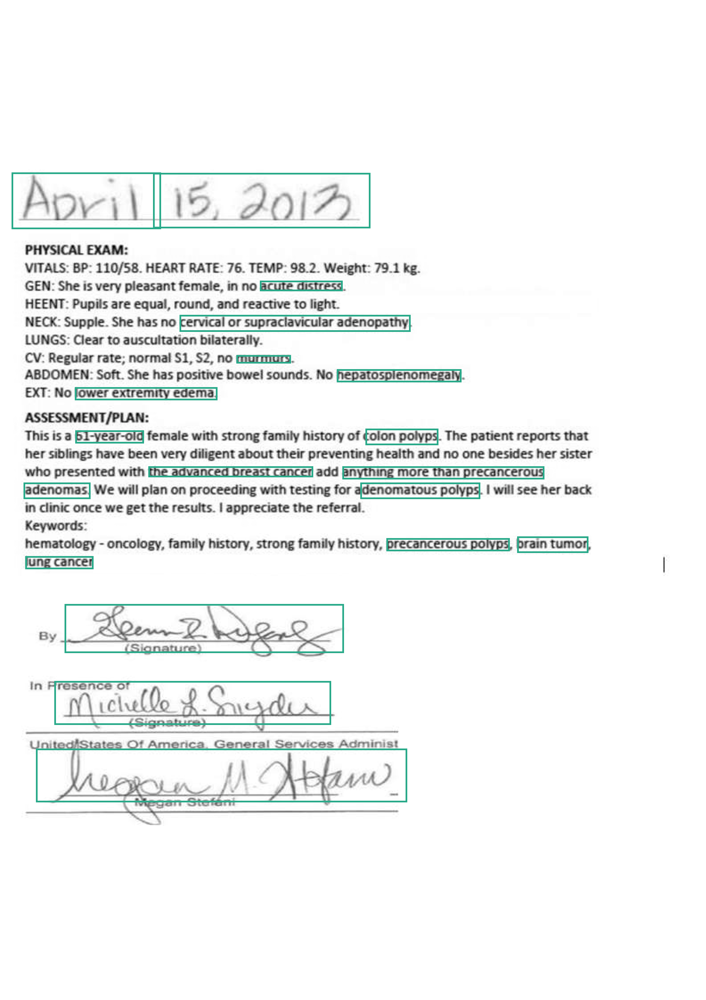

In [17]:
# Bounding Box with text type parameter
# Handling both handwritten and printed text at the same time

path='content/*.pdf'
box = "bounding_box"

ocr_entity_processor(spark=spark,
                    file_path = path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "bounding_box",
                    label= False,
                    display_result = True ,
                    outline_width = 4,
                    outline_color = (42, 170, 138),
                    text_type = "both")    ## Default = "printed"

### Highlighted Box

OCR pipeline is running...
Highlighting...
Saving started...
File saved to highlight/MT_OCR_HW_01_highlight.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


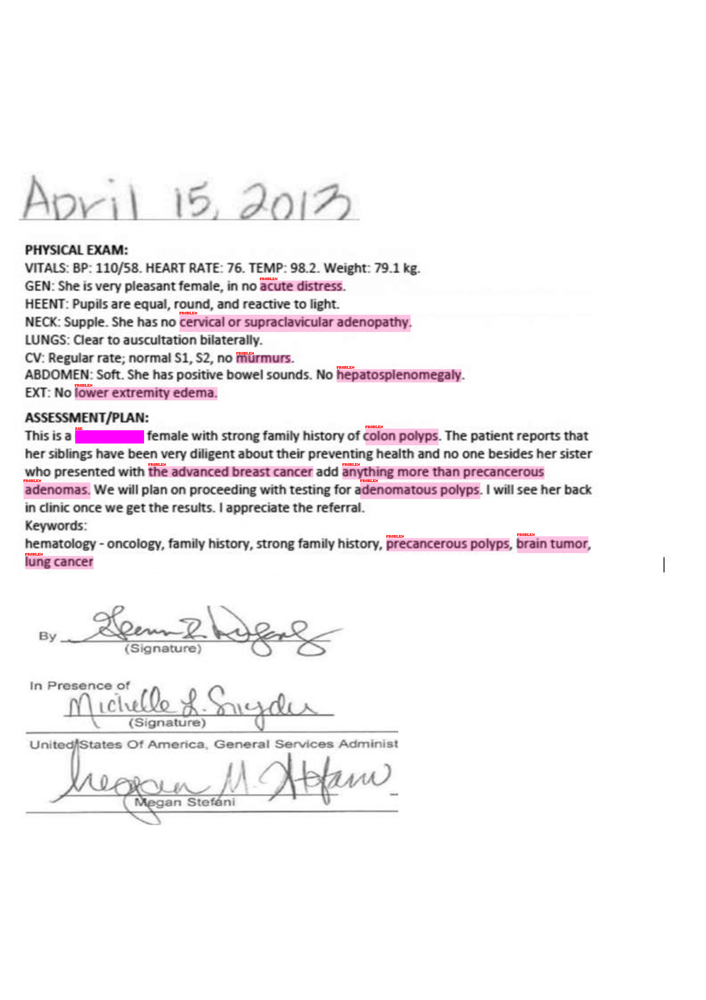

In [18]:
# Highlight with labels and black_list

path='content/*.pdf'
box = "highlight"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    black_list = ["AGE", "DATE", "PATIENT"],
                    style = box,
                    save_dir = "highlight",
                    label= True,
                    label_color = "red",
                    color_chart_path = "label_colors.png",
                    display_result=True)

OCR pipeline is running...
Highlighting...
Saving started...
File saved to highlight/MT_OCR_HW_01_highlight.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


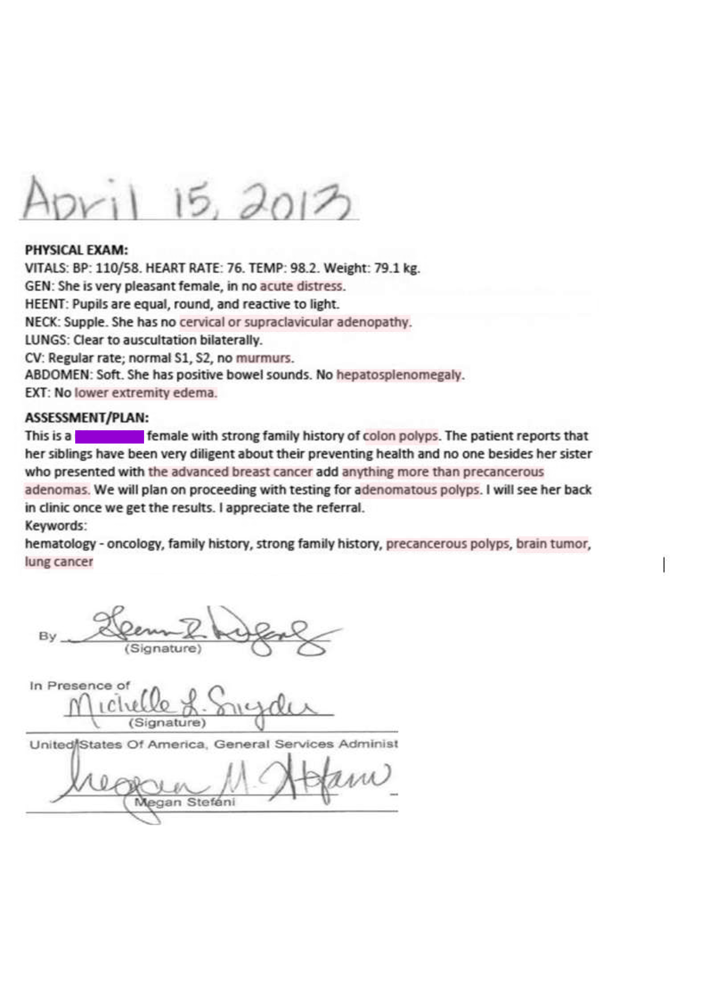

In [19]:
# Highlight without labels and with black_list

path='content/*.pdf'
box = "highlight"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    black_list = ["AGE", "DAte", "PATIENT"],
                    style = box,
                    save_dir = "highlight",
                    label= False,
                    label_color = "red",
                    color_chart_path = "label_colors.png",
                    display_result=True)

In [20]:
# Highlight without display

path='content/*.pdf'
box = "highlight"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    black_list = ["AGE", "DAte", "PATIENT"],
                    style = box,
                    save_dir = "highlight",
                    label= True,
                    label_color = "red",
                    color_chart_path = "label_colors.png",
                    display_result=False)

OCR pipeline is running...
Highlighting...
Saving started...
File saved to highlight/MT_OCR_HW_01_highlight.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


OCR pipeline is running...
Highlighting...
Saving started...
File saved to highlight/MT_OCR_HW_01_highlight.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


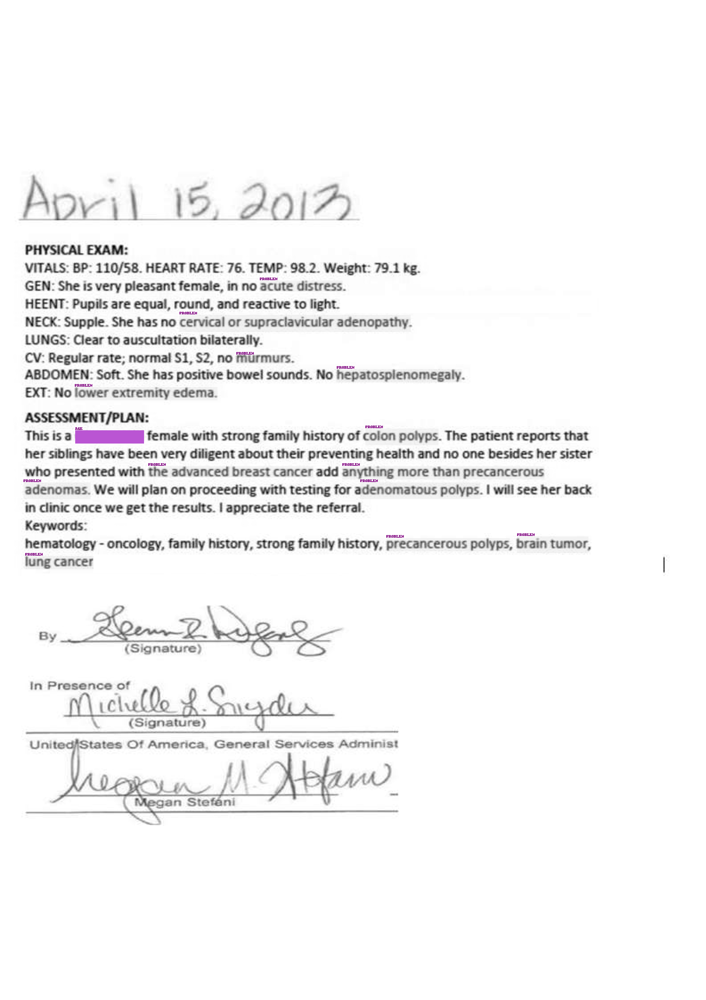

In [21]:
# Highlight change label color

path='content/*.pdf'
box = "highlight"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    black_list = ["AGE", "DAte", "PATIENT"],
                    style = box,
                    save_dir = "highlight",
                    label= True,
                    label_color = "purple",
                    color_chart_path = "label_colors.png",
                    display_result=True)

image_handwritten_detector_gsa0803 download started this may take some time.
Approximate size to download 244.5 MB
OCR pipeline is running...
Highlighting...
Saving started...
File saved to highlight/MT_OCR_HW_01_highlight.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


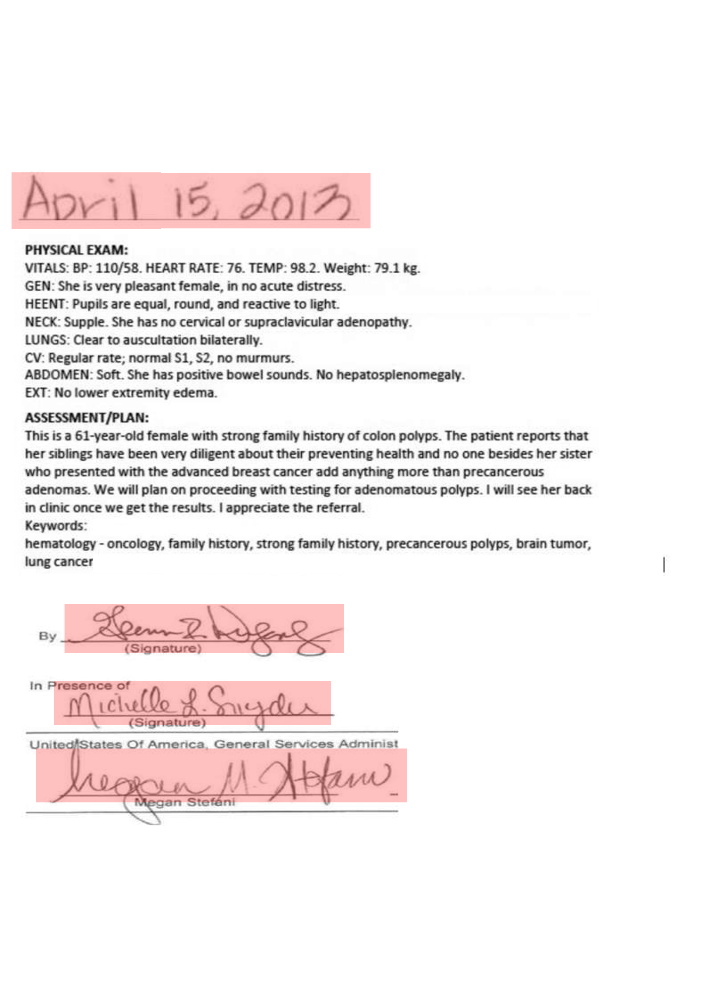

In [22]:
# Highlight with text type parameter
# Handling just handwritten text

path='content/*.pdf'
box = "highlight"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "highlight",
                    label= False,
                    color_chart_path = "label_colors.png",
                    display_result=True,
                    text_type = "handwritten")    ## Default = "printed"

image_handwritten_detector_gsa0803 download started this may take some time.
Approximate size to download 244.5 MB
OCR pipeline is running...
Highlighting...
Saving started...
File saved to highlight/MT_OCR_HW_01_highlight.pdf successfully.
Color chart of the entity labels is saved to label_colors.png.


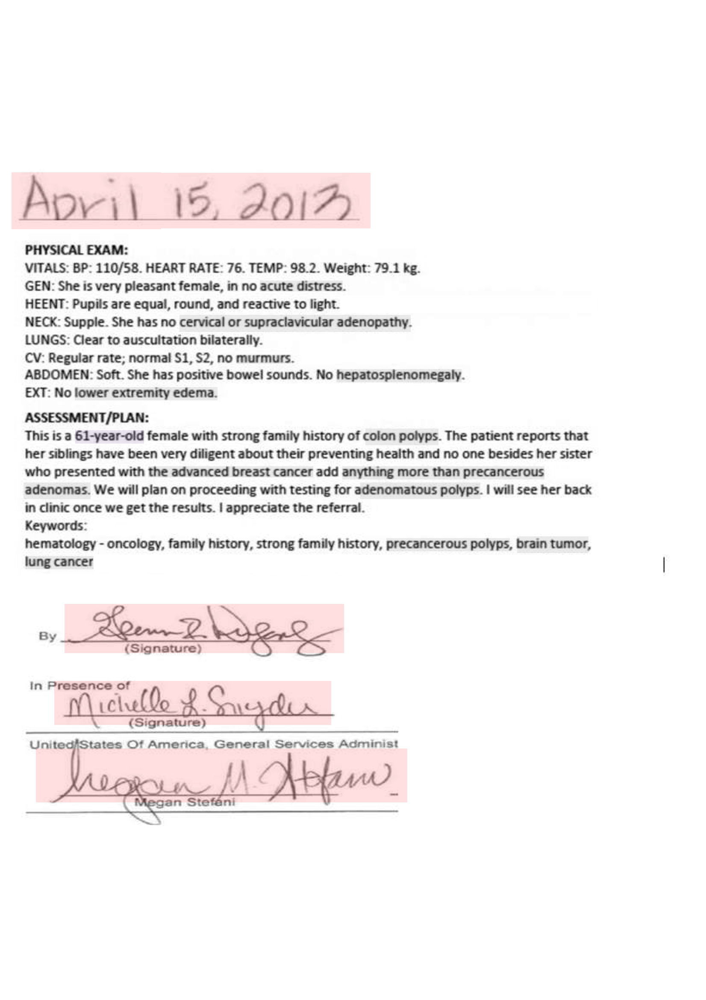

In [23]:
# Highlight with text type parameter
# Handling both handwritten and printed text at the same time

path='content/*.pdf'
box = "highlight"

ocr_entity_processor(spark=spark,
                     file_path=path,
                    ner_pipeline = nlp_model,
                    chunk_col = "merged_chunk",
                    style = box,
                    save_dir = "highlight",
                    label= False,
                    color_chart_path = "label_colors.png",
                    display_result=True,
                    text_type = "both")    ## Default = "printed"